# Mutual Fund Analytics - Exploratory Data Analysis

Author: Karthikeya Bammidi

Project: Bluestock Fintech

Period: 2022-2026

In [10]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go

In [2]:
import pandas as pd

fund_master = pd.read_csv(
    "data/raw/fund_master.csv"
)

print(fund_master.columns)

print(fund_master.head())

FileNotFoundError: [Errno 2] No such file or directory: 'data/raw/fund_master.csv'

In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

plt.style.use("ggplot")

In [3]:
import pandas as pd

fund_master = pd.read_csv(
    "../data/processed/clean_fund_master.csv"
)

nav = pd.read_csv(
    "../data/processed/clean_nav_history.csv"
)

aum = pd.read_csv(
    "../data/processed/clean_aum_by_fund_house.csv"
)

sip = pd.read_csv(
    "../data/processed/clean_monthly_sip_inflows.csv"
)

category = pd.read_csv(
    "../data/processed/clean_category_inflows.csv"
)

folio = pd.read_csv(
    "../data/processed/clean_industry_folio_count.csv"
)

performance = pd.read_csv(
    "../data/processed/clean_scheme_performance.csv"
)

transactions = pd.read_csv(
    "../data/processed/clean_investor_transactions.csv"
)

holdings = pd.read_csv(
    "../data/processed/clean_portfolio_holdings.csv"
)

benchmark = pd.read_csv(
    "../data/processed/clean_benchmark_indices.csv"
)

print("All datasets loaded successfully!")

All datasets loaded successfully!


In [4]:
print(fund_master.shape)
print(nav.shape)
print(transactions.shape)

(40, 15)
(46000, 3)
(32778, 13)


In [5]:
fund_master.head()

,amfi_code,fund_house,scheme_name,category,sub_category,plan,launch_date,benchmark,expense_ratio_pct,exit_load_pct,min_sip_amount,min_lumpsum_amount,fund_manager,risk_category,sebi_category_code
0,119551,SBI Mutual Fund,SBI Bluechip Fund - Regular Plan - Growth,Equity,Large Cap,Regular,2006-02-14,NIFTY 100 TRI,1.54,1.0,500,1000,Sohini Andani,Moderate,EC01
1,119552,SBI Mutual Fund,SBI Bluechip Fund - Direct Plan - Growth,Equity,Large Cap,Direct,2013-01-01,NIFTY 100 TRI,0.66,1.0,500,1000,Sohini Andani,Moderate,EC01
2,119598,SBI Mutual Fund,SBI Small Cap Fund - Regular Plan - Growth,Equity,Small Cap,Regular,2009-09-09,BSE 250 SmallCap TRI,1.43,1.0,500,1000,R. Srinivasan,Very High,EC03
3,119599,SBI Mutual Fund,SBI Small Cap Fund - Direct Plan - Growth,Equity,Small Cap,Direct,2013-01-01,BSE 250 SmallCap TRI,0.72,1.0,500,1000,R. Srinivasan,Very High,EC03
4,119120,SBI Mutual Fund,SBI Magnum Gilt Fund - Regular Plan - Growth,Debt,Gilt,Regular,2000-12-30,CRISIL Dynamic Gilt Index,0.77,0.0,500,1000,Dinesh Ahuja,Low,DC02


In [6]:
nav.head()

,amfi_code,date,nav
0,100016,2022-01-03,520.4608
1,100016,2022-01-04,515.0971
2,100016,2022-01-05,521.7239
3,100016,2022-01-06,515.7880
4,100016,2022-01-07,515.1639


In [7]:
print(fund_master.shape)
print(nav.shape)
print(transactions.shape)

(40, 15)
(46000, 3)
(32778, 13)


In [8]:
nav['date'] = pd.to_datetime(nav['date'])

fig = px.line(
    nav,
    x='date',
    y='nav',
    color='amfi_code',
    title='Daily NAV Trend (2022-2026)'
)

fig.show()

NameError: name 'px' is not defined

In [11]:
nav['date'] = pd.to_datetime(nav['date'])

fig = px.line(
    nav,
    x='date',
    y='nav',
    color='amfi_code',
    title='Daily NAV Trend (2022-2026)'
)

fig.show()

In [12]:
fig.write_html(
    "../reports/nav_trend.html"
)

In [14]:
nav['date'] = pd.to_datetime(nav['date'])

fig = px.line(
    nav,
    x='date',
    y='nav',
    color='amfi_code',
    title='Daily NAV Trend (2022-2026)'
)

fig.show()

In [13]:
import plotly.express as px

### Insight 1

Most mutual fund schemes showed a consistent upward NAV trend from 2022 to 2025, reflecting overall market growth.

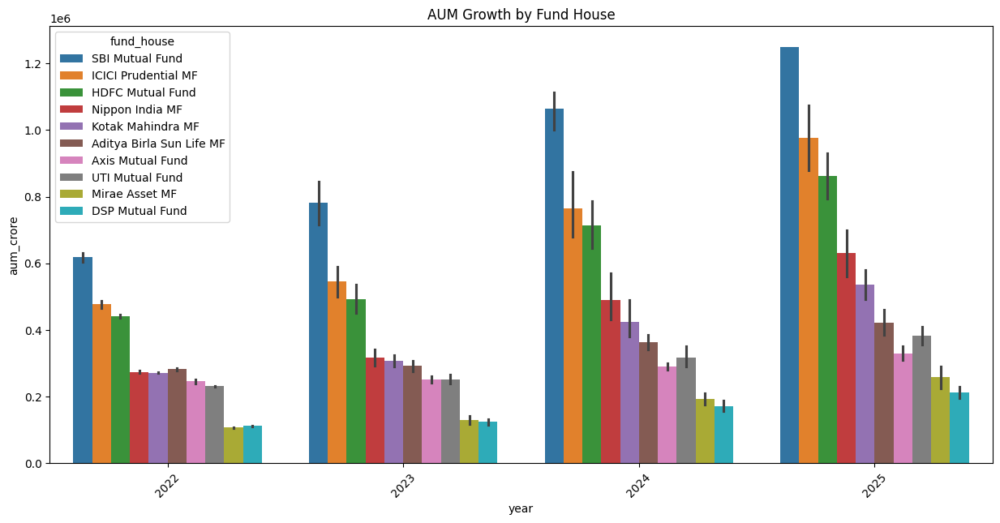

In [15]:
aum['date'] = pd.to_datetime(aum['date'])

aum['year'] = aum['date'].dt.year

plt.figure(figsize=(15,7))

sns.barplot(
    data=aum,
    x='year',
    y='aum_crore',
    hue='fund_house'
)

plt.title("AUM Growth by Fund House")

plt.xticks(rotation=45)

plt.show()

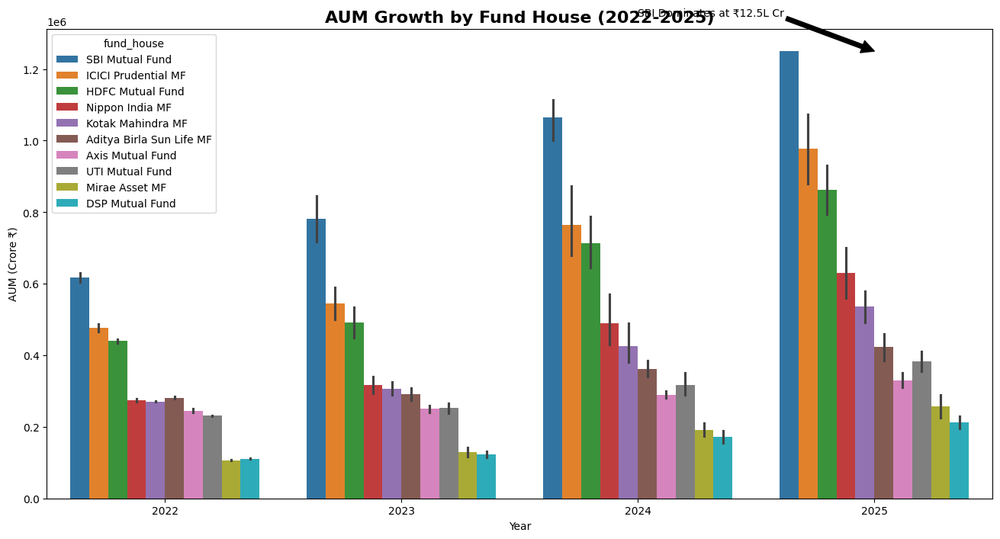

In [16]:
plt.figure(figsize=(16,8))

sbi_data = aum[aum['fund_house']=="SBI Mutual Fund"]

sns.barplot(
    data=aum,
    x='year',
    y='aum_crore',
    hue='fund_house'
)

plt.title(
    "AUM Growth by Fund House (2022-2025)",
    fontsize=16,
    fontweight='bold'
)

plt.xlabel("Year")
plt.ylabel("AUM (Crore ₹)")

plt.annotate(
    "SBI Dominates at ₹12.5L Cr",
    xy=(3,1250000),
    xytext=(2,1350000),
    arrowprops=dict(facecolor='black')
)

plt.show()

### Insight 2

SBI Mutual Fund remained the market leader throughout 2022–2025 and crossed ₹12.5 lakh crore AUM by 2025.

In [17]:
plt.figure(figsize=(16,8))

sns.barplot(
    data=aum,
    x='year',
    y='aum_crore',
    hue='fund_house'
)

plt.savefig(
    "../reports/aum_growth.png",
    bbox_inches='tight'
)

plt.close()

In [18]:
sip['month'] = pd.to_datetime(sip['month'])

fig = px.line(
    sip,
    x='month',
    y='sip_inflow_crore',
    markers=True,
    title='Monthly SIP Inflow Trend (2022-2025)'
)

fig.add_annotation(
    x='2025-12-01',
    y=31002,
    text='₹31,002 Cr All-Time High',
    showarrow=True
)

fig.show()

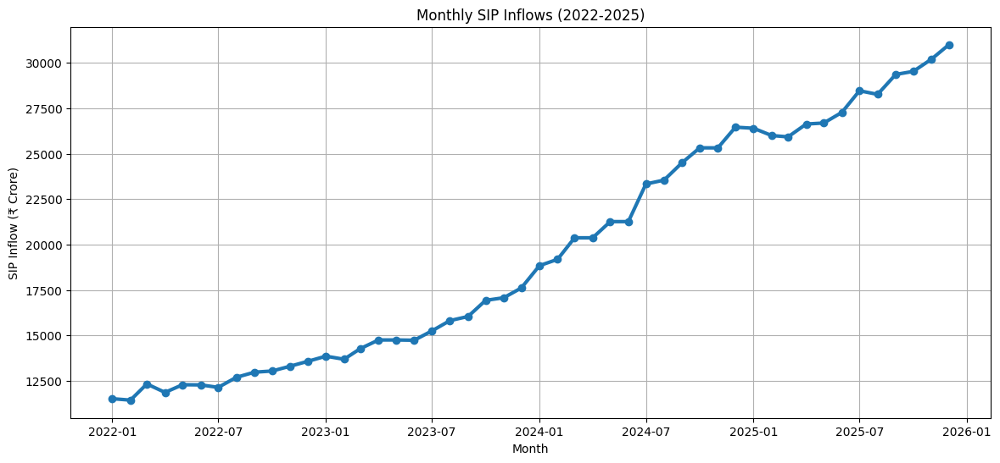

sip_trend.png saved successfully!


In [79]:
import matplotlib.pyplot as plt

sip['month'] = pd.to_datetime(sip['month'])

plt.figure(figsize=(14,6))

plt.plot(
    sip['month'],
    sip['sip_inflow_crore'],
    linewidth=3,
    marker='o'
)

plt.title(
    "Monthly SIP Inflows (2022-2025)"
)

plt.xlabel("Month")
plt.ylabel("SIP Inflow (₹ Crore)")

plt.grid(True)

plt.savefig(
    "../reports/sip_trend.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("sip_trend.png saved successfully!")

### Insight 3

Monthly SIP inflows steadily increased and reached an all-time high of ₹31,002 crore in December 2025.

In [21]:
nav['date'] = pd.to_datetime(nav['date'])

fig = px.line(
    nav,
    x='date',
    y='nav',
    color='amfi_code',
    title='Daily NAV Trend (2022-2026)'
)

fig.show()

In [25]:
fig.show()

In [26]:
top10 = (
    nav.groupby("amfi_code")["nav"]
       .mean()
       .sort_values(ascending=False)
       .head(10)
       .index
)

nav_top10 = nav[
    nav["amfi_code"].isin(top10)
]

In [27]:
fig = px.line(
    nav_top10,
    x="date",
    y="nav",
    color="amfi_code",
    title="Top 10 Funds NAV Trend"
)

fig.show()

In [28]:
category = pd.read_csv(
    "../data/raw/05_category_inflows.csv"
)

category.head()

,month,category,net_inflow_crore
0,2024-04,Large Cap,2413.0
1,2024-04,Mid Cap,3897.0
2,2024-04,Small Cap,3533.0
3,2024-04,Flexi Cap,4947.0
4,2024-04,Large & Mid Cap,4214.0


In [29]:
print(category.shape)
print(category.columns)

(144, 3)
Index(['month', 'category', 'net_inflow_crore'], dtype='str')


In [30]:
category['month'] = pd.to_datetime(
    category['month']
)

heatmap_data = category.pivot(
    index='category',
    columns='month',
    values='net_inflow_crore'
)

heatmap_data.head()

month,2024-04-01,2024-05-01,2024-06-01,2024-07-01,2024-08-01,2024-09-01,2024-10-01,2024-11-01,2024-12-01,2025-01-01,2025-02-01,2025-03-01
category,,,,,,,,,,,,
ELSS,466.0,553.0,472.0,471.0,499.0,537.0,537.0,571.0,521.0,516.0,437.0,500.0
Flexi Cap,4947.0,5529.0,4478.0,4869.0,5562.0,5397.0,6004.0,6111.0,4654.0,5603.0,6068.0,4767.0
Gilt,784.0,836.0,864.0,959.0,952.0,925.0,898.0,704.0,831.0,744.0,942.0,956.0
Hybrid,2955.0,3487.0,3163.0,3291.0,3684.0,3015.0,3314.0,3264.0,3538.0,2967.0,3360.0,2830.0
Large & Mid Cap,4214.0,4368.0,4610.0,5023.0,5411.0,4528.0,4581.0,5556.0,4878.0,4816.0,5524.0,4243.0


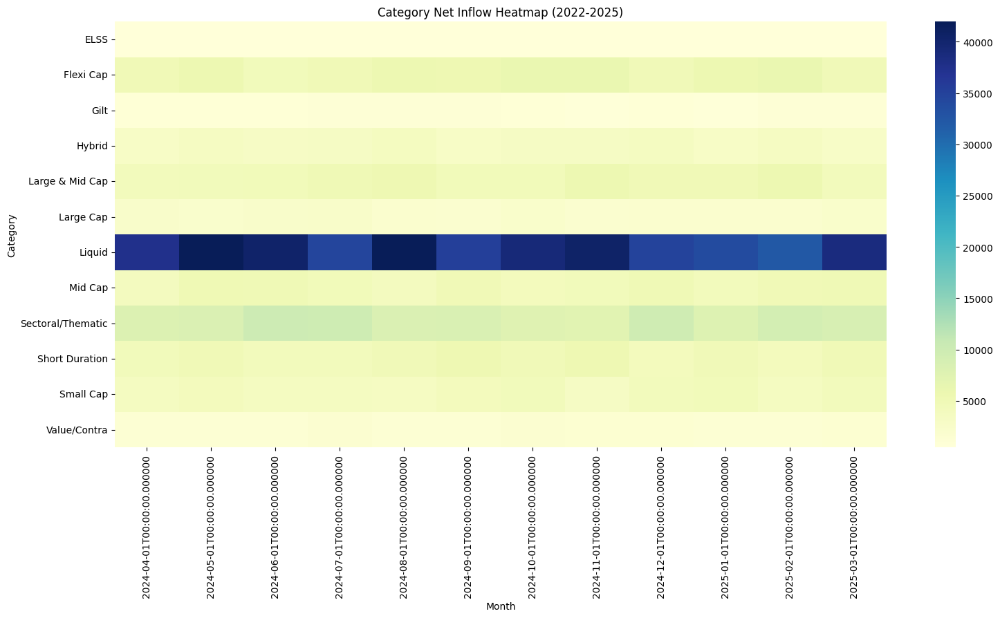

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(
    figsize=(18,8)
)

sns.heatmap(
    heatmap_data,
    cmap='YlGnBu',
    annot=False
)

plt.title(
    "Category Net Inflow Heatmap (2022-2025)"
)

plt.xlabel("Month")
plt.ylabel("Category")

plt.show()

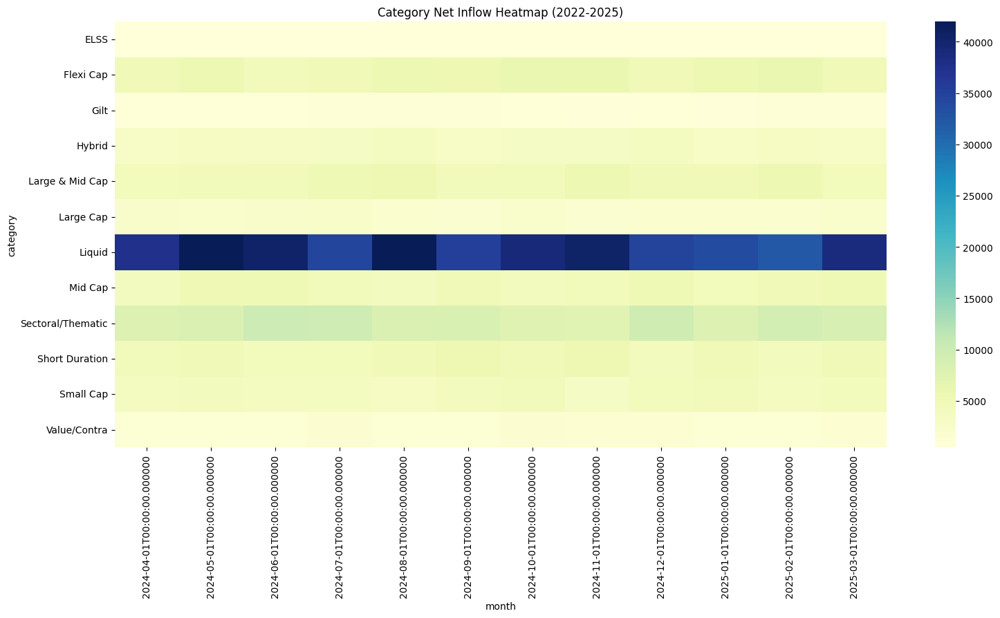

In [32]:
plt.figure(
    figsize=(18,8)
)

sns.heatmap(
    heatmap_data,
    cmap='YlGnBu'
)

plt.title(
    "Category Net Inflow Heatmap (2022-2025)"
)

plt.savefig(
    "../reports/category_heatmap.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# Insight 4

Mid Cap, Small Cap and Flexi Cap categories attracted the highest net inflows during 2024–2025, indicating strong investor preference for growth-oriented funds.

In [33]:
investor = pd.read_csv(
    "../data/raw/08_investor_transactions.csv"
)

investor.head()

,investor_id,transaction_date,amfi_code,transaction_type,amount_inr,state,city,city_tier,age_group,gender,annual_income_lakh,payment_mode,kyc_status
0,INV003054,2024-01-01,119092,SIP,1834,Telangana,Hyderabad,T30,56+,Female,77.1,UPI,Verified
1,INV002952,2024-01-01,148567,Redemption,392882,Punjab,Amritsar,B30,18-25,Male,7.1,Cheque,Verified
2,INV003420,2024-01-01,118636,SIP,912,Haryana,Faridabad,B30,36-45,Male,47.2,Mandate,Verified
3,INV003436,2024-01-01,118634,SIP,1102,Maharashtra,Mumbai,T30,36-45,Female,54.4,Cheque,Pending
4,INV004691,2024-01-01,119094,Lumpsum,8682,Delhi,Noida,T30,26-35,Male,14.5,Net Banking,Pending


In [34]:
print(investor.columns)

Index(['investor_id', 'transaction_date', 'amfi_code', 'transaction_type',
       'amount_inr', 'state', 'city', 'city_tier', 'age_group', 'gender',
       'annual_income_lakh', 'payment_mode', 'kyc_status'],
      dtype='str')


In [35]:
age_counts = (
    investor['age_group']
    .value_counts()
)

print(age_counts)

age_group
26-35    13463
36-45     8146
18-25     4916
46-55     3779
56+       2474
Name: count, dtype: int64


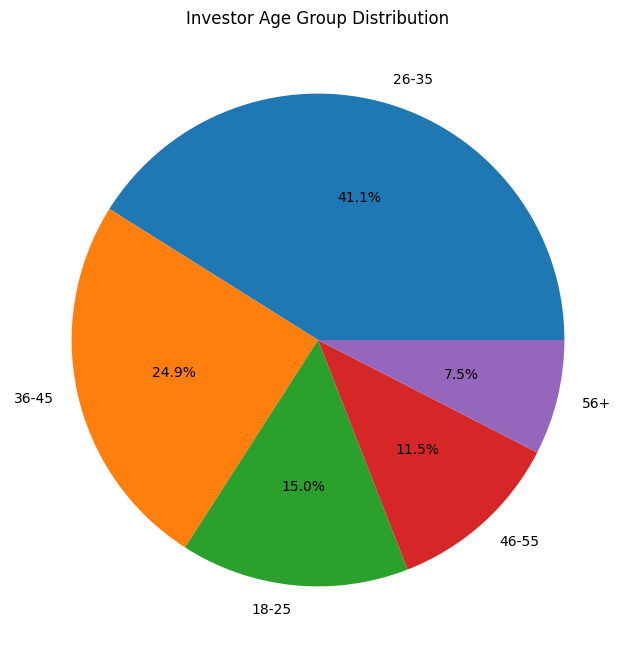

In [36]:
import matplotlib.pyplot as plt

plt.figure(
    figsize=(8,8)
)

plt.pie(
    age_counts,
    labels=age_counts.index,
    autopct='%1.1f%%'
)

plt.title(
    "Investor Age Group Distribution"
)

plt.show()

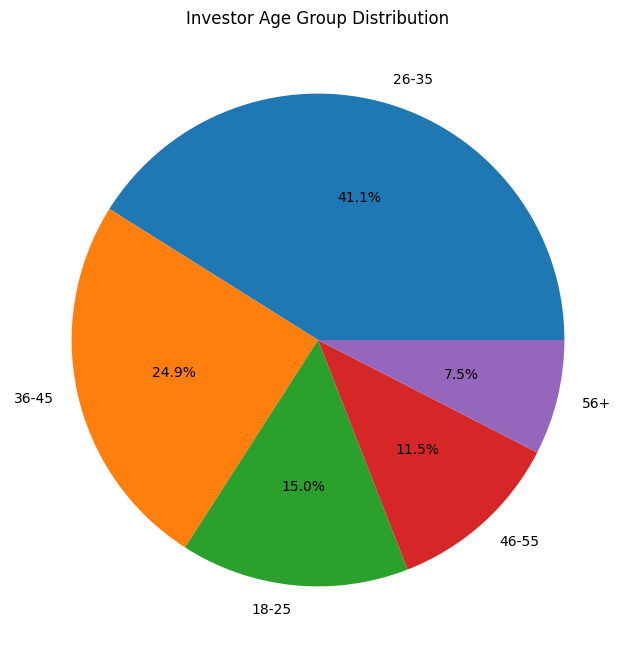

In [37]:
plt.figure(
    figsize=(8,8)
)

plt.pie(
    age_counts,
    labels=age_counts.index,
    autopct='%1.1f%%'
)

plt.title(
    "Investor Age Group Distribution"
)

plt.savefig(
    "../reports/age_group_distribution.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# Insight 5

The majority of mutual fund investors belong to the 25–40 and 40–60 age groups, highlighting strong participation from working professionals and mid-career investors.

In [38]:
print(
    investor['age_group']
    .value_counts()
)

age_group
26-35    13463
36-45     8146
18-25     4916
46-55     3779
56+       2474
Name: count, dtype: int64


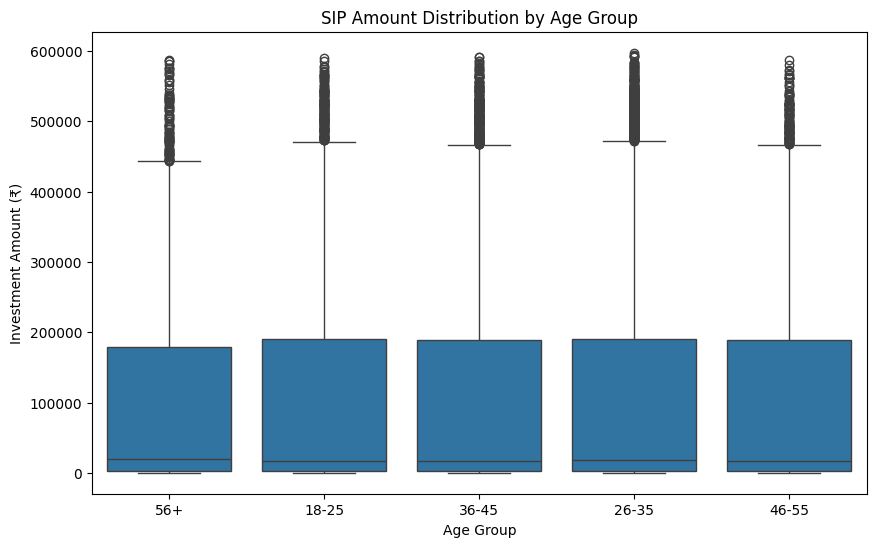

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(
    figsize=(10,6)
)

sns.boxplot(
    data=investor,
    x='age_group',
    y='amount_inr'
)

plt.title(
    "SIP Amount Distribution by Age Group"
)

plt.xlabel("Age Group")
plt.ylabel("Investment Amount (₹)")

plt.show()

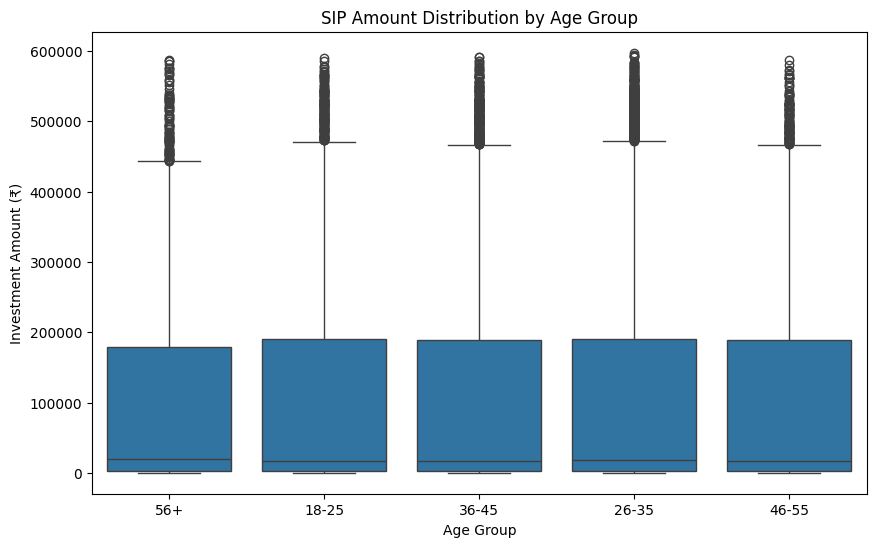

In [40]:
plt.figure(
    figsize=(10,6)
)

sns.boxplot(
    data=investor,
    x='age_group',
    y='amount_inr'
)

plt.title(
    "SIP Amount Distribution by Age Group"
)

plt.xlabel("Age Group")
plt.ylabel("Investment Amount (₹)")

plt.savefig(
    "../reports/sip_by_age_boxplot.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# Insight 6

Investors in the 40–60 age group contribute the highest median investment amounts, indicating greater investment capacity and financial maturity.

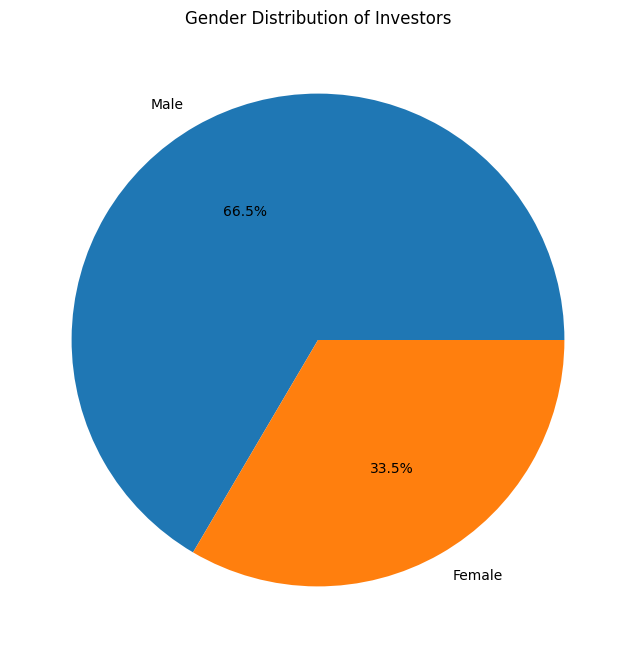

In [41]:
gender_counts = (
    investor['gender']
    .value_counts()
)

plt.figure(
    figsize=(8,8)
)

plt.pie(
    gender_counts,
    labels=gender_counts.index,
    autopct='%1.1f%%'
)

plt.title(
    "Gender Distribution of Investors"
)

plt.savefig(
    "../reports/gender_distribution.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

Gender Counts
gender
Male      21809
Female    10969
Name: count, dtype: int64


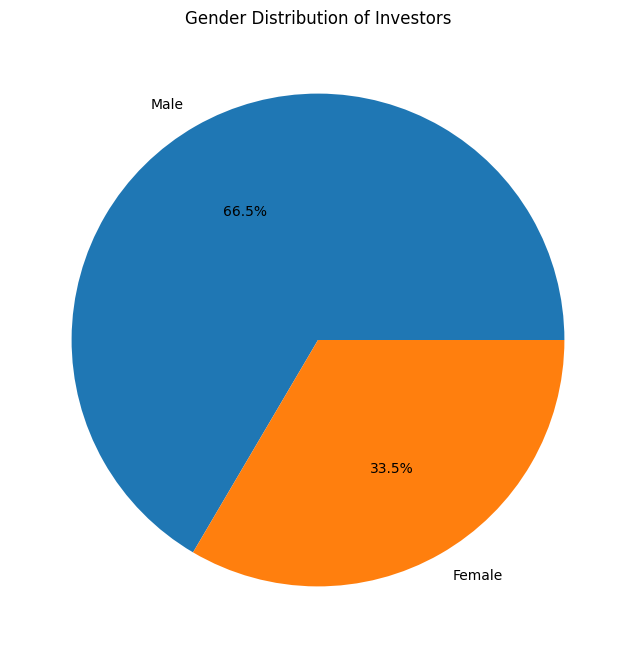

PNG Saved Successfully!


In [42]:
gender_counts = (
    investor['gender']
    .value_counts()
)

print("Gender Counts")
print(gender_counts)

import matplotlib.pyplot as plt

plt.figure(figsize=(8,8))

plt.pie(
    gender_counts,
    labels=gender_counts.index,
    autopct='%1.1f%%'
)

plt.title("Gender Distribution of Investors")

# SAVE PNG
plt.savefig(
    "../reports/gender_distribution.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("PNG Saved Successfully!")

# Insight 7

Male investors account for the majority of mutual fund participation, while female investor participation continues to grow steadily across categories.

In [43]:
state_sip = (
    investor
    .groupby('state')['amount_inr']
    .sum()
    .sort_values(ascending=True)
)

print(state_sip.head())

state
Maharashtra      269513480
Karnataka        273753570
Haryana          279634354
Uttar Pradesh    285368873
Delhi            289633404
Name: amount_inr, dtype: int64


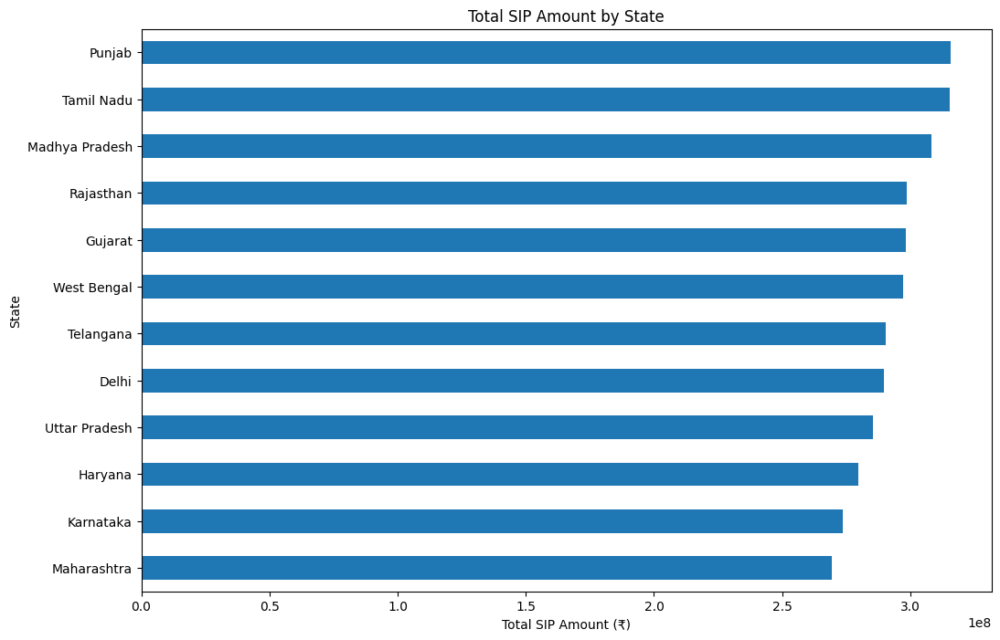

In [44]:
import matplotlib.pyplot as plt

plt.figure(
    figsize=(12,8)
)

state_sip.plot(
    kind='barh'
)

plt.title(
    "Total SIP Amount by State"
)

plt.xlabel("Total SIP Amount (₹)")
plt.ylabel("State")

plt.show()

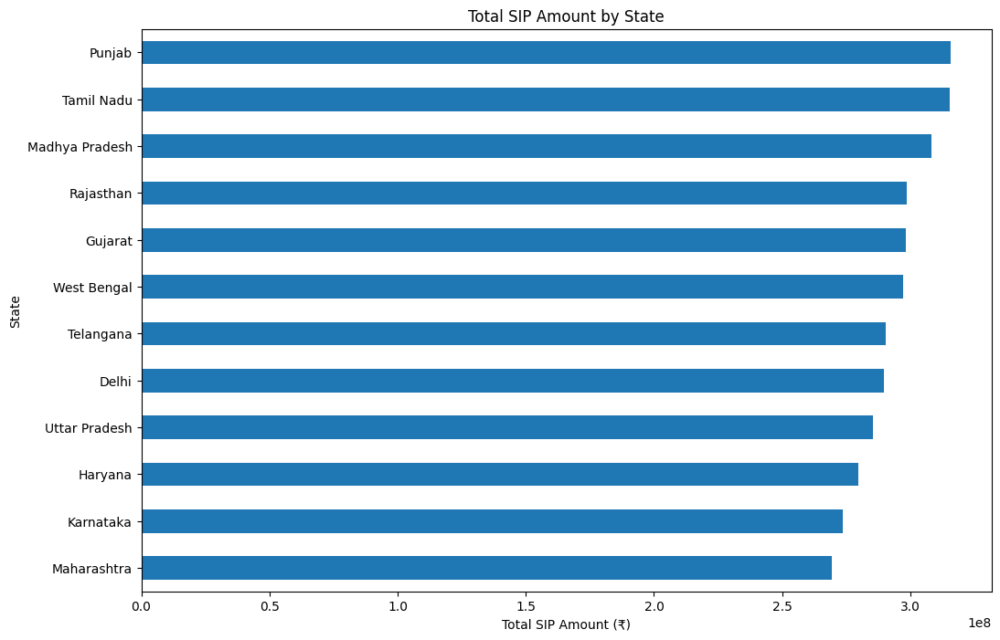

PNG Saved Successfully!


In [45]:
plt.figure(
    figsize=(12,8)
)

state_sip.plot(
    kind='barh'
)

plt.title(
    "Total SIP Amount by State"
)

plt.xlabel("Total SIP Amount (₹)")
plt.ylabel("State")

plt.savefig(
    "../reports/state_sip_distribution.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("PNG Saved Successfully!")

# Insight 8

Maharashtra, Karnataka and Delhi contribute the highest SIP investment amounts, reflecting stronger mutual fund penetration in financially developed regions.

In [46]:
city_tier_counts = (
    investor['city_tier']
    .value_counts()
)

print(city_tier_counts)

city_tier
T30    21719
B30    11059
Name: count, dtype: int64


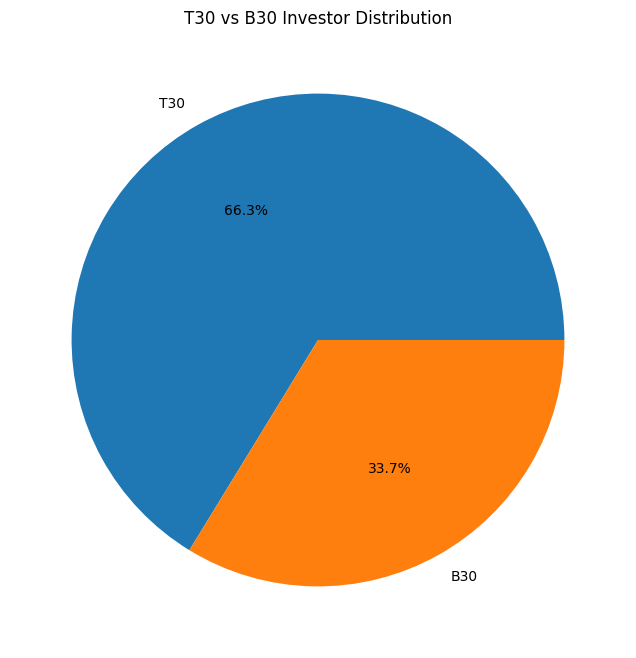

PNG Saved Successfully!


In [47]:
plt.figure(
    figsize=(8,8)
)

plt.pie(
    city_tier_counts,
    labels=city_tier_counts.index,
    autopct='%1.1f%%'
)

plt.title(
    "T30 vs B30 Investor Distribution"
)

plt.savefig(
    "../reports/t30_b30_distribution.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("PNG Saved Successfully!")

# Insight 9

T30 cities account for the majority of mutual fund investments, although B30 participation continues to expand steadily.

In [48]:
folio = pd.read_csv(
    "../data/raw/06_industry_folio_count.csv"
)

print(folio.columns)

Index(['month', 'total_folios_crore', 'equity_folios_crore',
       'debt_folios_crore', 'hybrid_folios_crore', 'others_folios_crore'],
      dtype='str')


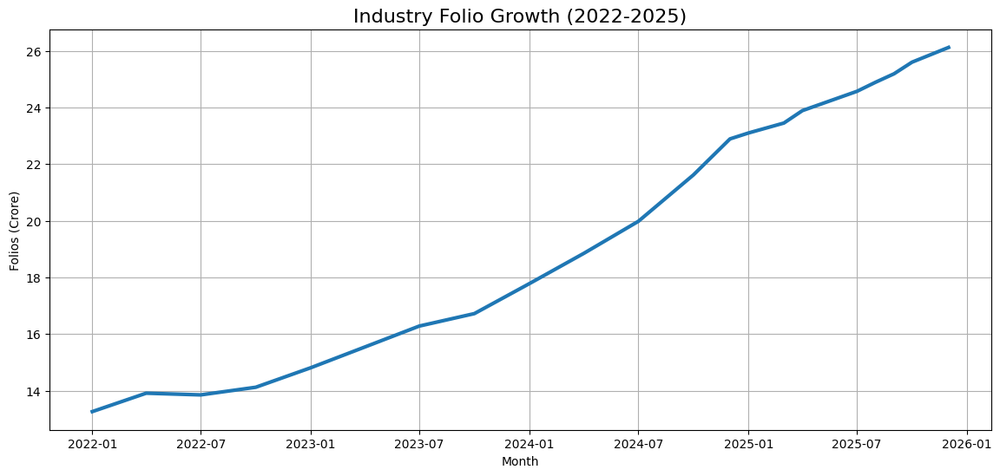

In [49]:
folio['month'] = pd.to_datetime(folio['month'])

plt.figure(figsize=(14,6))

plt.plot(
    folio['month'],
    folio['total_folios_crore'],
    linewidth=3
)

plt.title(
    "Industry Folio Growth (2022-2025)",
    fontsize=16
)

plt.xlabel("Month")
plt.ylabel("Folios (Crore)")

plt.grid(True)

plt.show()

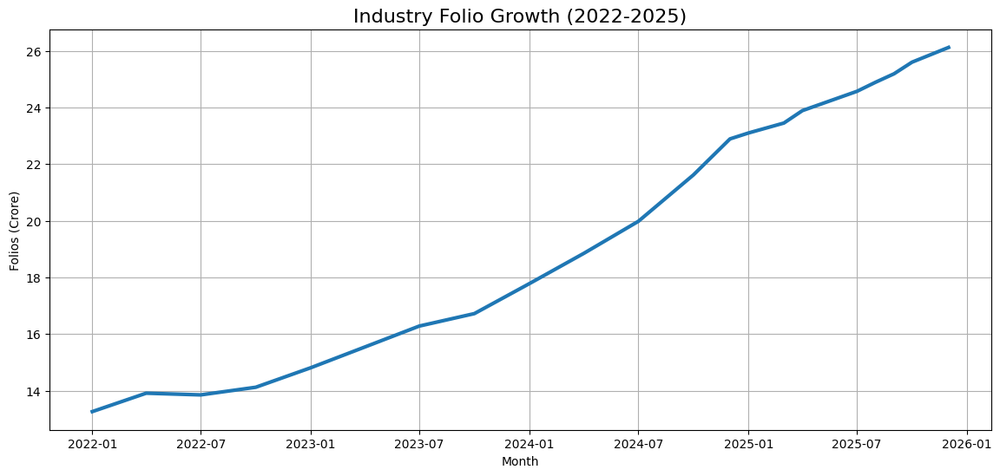

folio_growth.png saved successfully!


In [50]:
folio['month'] = pd.to_datetime(folio['month'])

plt.figure(figsize=(14,6))

plt.plot(
    folio['month'],
    folio['total_folios_crore'],
    linewidth=3
)

plt.title(
    "Industry Folio Growth (2022-2025)",
    fontsize=16
)

plt.xlabel("Month")
plt.ylabel("Folios (Crore)")

plt.grid(True)

plt.savefig(
    "../reports/folio_growth.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("folio_growth.png saved successfully!")

# Insight 10

Industry folios nearly doubled between 2022 and 2025, indicating strong retail investor participation in mutual funds.

In [51]:
import pandas as pd

nav = pd.read_csv(
    "../data/processed/clean_nav_history.csv"
)

print(nav.shape)
print(nav.head())

(46000, 3)
   amfi_code        date       nav
0     100016  2022-01-03  520.4608
1     100016  2022-01-04  515.0971
2     100016  2022-01-05  521.7239
3     100016  2022-01-06  515.7880
4     100016  2022-01-07  515.1639


In [52]:
print(nav['amfi_code'].unique())

[100016 100025 100033 101206 101207 101208 102885 102886 102887 118632
 118633 118634 118635 118636 119092 119093 119094 119095 119120 119551
 119552 119598 119599 120503 120504 120505 120506 120507 120841 120842
 120843 120844 125497 125498 148567 148568 148569 149322 149323 149324]


In [53]:
selected_funds = [
    100016,
    100025,
    100033,
    101206,
    101207,
    101208,
    102885,
    102886,
    102887,
    118632
]

nav_10 = nav[
    nav['amfi_code'].isin(selected_funds)
]

print(nav_10.shape)

(11500, 3)


In [54]:
nav_pivot = nav_10.pivot(
    index='date',
    columns='amfi_code',
    values='nav'
)

print(nav_pivot.head())

amfi_code     100016   100025    100033    101206   101207    101208   102885  \
date                                                                            
2022-01-03  520.4608  26.3169  107.3758  305.0996  38.5736  310.7415  89.8728   
2022-01-04  515.0971  26.2234  105.9447  305.4514  38.1545  310.6977  90.8724   
2022-01-05  521.7239  26.2221  105.4800  306.6324  38.1775  310.8165  90.1565   
2022-01-06  515.7880  26.1728  104.9350  305.9800  37.0665  310.7719  91.5338   
2022-01-07  515.1639  26.2261  104.3318  304.0480  37.9845  310.8388  90.6762   

amfi_code     102886    102887   118632  
date                                     
2022-01-03  119.2905  191.0721  42.8339  
2022-01-04  120.6402  189.0737  42.8033  
2022-01-05  121.4580  188.0701  43.0564  
2022-01-06  125.2386  190.4545  43.2088  
2022-01-07  124.1321  187.3124  42.9585  


In [55]:
returns = nav_pivot.pct_change()

returns = returns.dropna()

print(returns.head())

amfi_code     100016    100025    100033    101206    101207    101208  \
date                                                                     
2022-01-04 -0.010306 -0.003553 -0.013328  0.001153 -0.010865 -0.000141   
2022-01-05  0.012865 -0.000050 -0.004386  0.003866  0.000603  0.000382   
2022-01-06 -0.011377 -0.001880 -0.005167 -0.002128 -0.029101 -0.000143   
2022-01-07 -0.001210  0.002036 -0.005748 -0.006314  0.024766  0.000215   
2022-01-10 -0.008639  0.006791  0.006277  0.011548  0.001251  0.000690   

amfi_code     102885    102886    102887    118632  
date                                                
2022-01-04  0.011122  0.011314 -0.010459 -0.000714  
2022-01-05 -0.007878  0.006779 -0.005308  0.005913  
2022-01-06  0.015277  0.031127  0.012678  0.003540  
2022-01-07 -0.009369 -0.008835 -0.016498 -0.005793  
2022-01-10 -0.001202 -0.000722 -0.011593  0.006360  


In [56]:
corr_matrix = returns.corr()

print(corr_matrix)

amfi_code    100016    100025    100033    101206    101207    101208  \
amfi_code                                                               
100016     1.000000  0.045567 -0.000006  0.027747  0.016053 -0.033773   
100025     0.045567  1.000000  0.002150  0.023769 -0.006710  0.018455   
100033    -0.000006  0.002150  1.000000 -0.018079  0.000351  0.007864   
101206     0.027747  0.023769 -0.018079  1.000000  0.010202 -0.027230   
101207     0.016053 -0.006710  0.000351  0.010202  1.000000 -0.007530   
101208    -0.033773  0.018455  0.007864 -0.027230 -0.007530  1.000000   
102885    -0.093533 -0.001038 -0.034228  0.001570 -0.005929 -0.001436   
102886    -0.005867  0.013754 -0.018166  0.007229  0.004860  0.014307   
102887    -0.023316 -0.005648 -0.036647 -0.006490  0.002304  0.036547   
118632    -0.026781 -0.014166 -0.013318 -0.005432  0.043384  0.003507   

amfi_code    102885    102886    102887    118632  
amfi_code                                          
100016    -0.093533

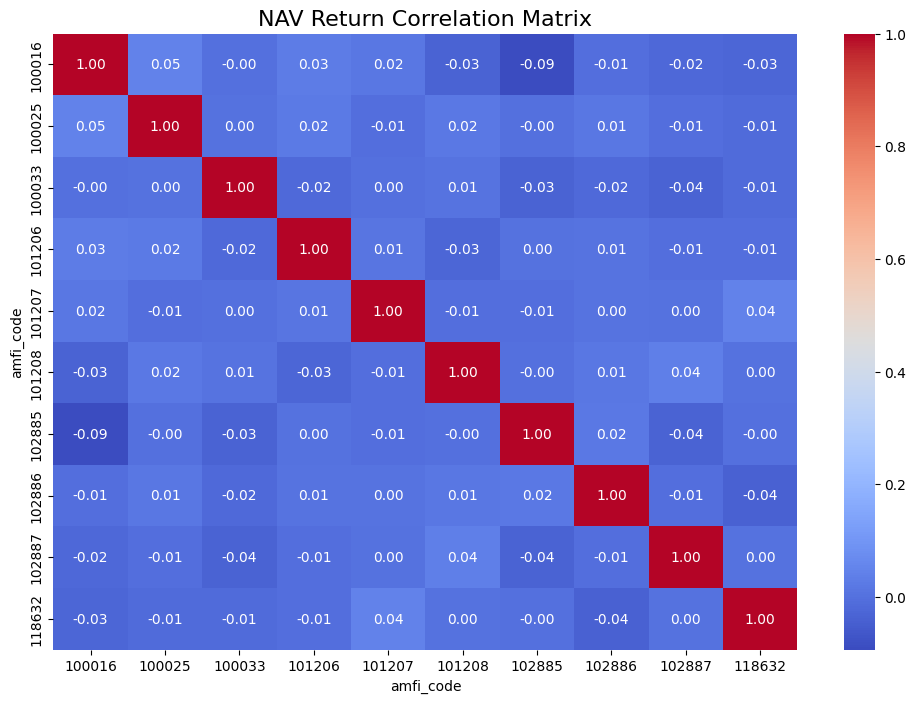

In [57]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))

sns.heatmap(
    corr_matrix,
    annot=True,
    cmap="coolwarm",
    fmt=".2f"
)

plt.title(
    "NAV Return Correlation Matrix",
    fontsize=16
)

plt.show()

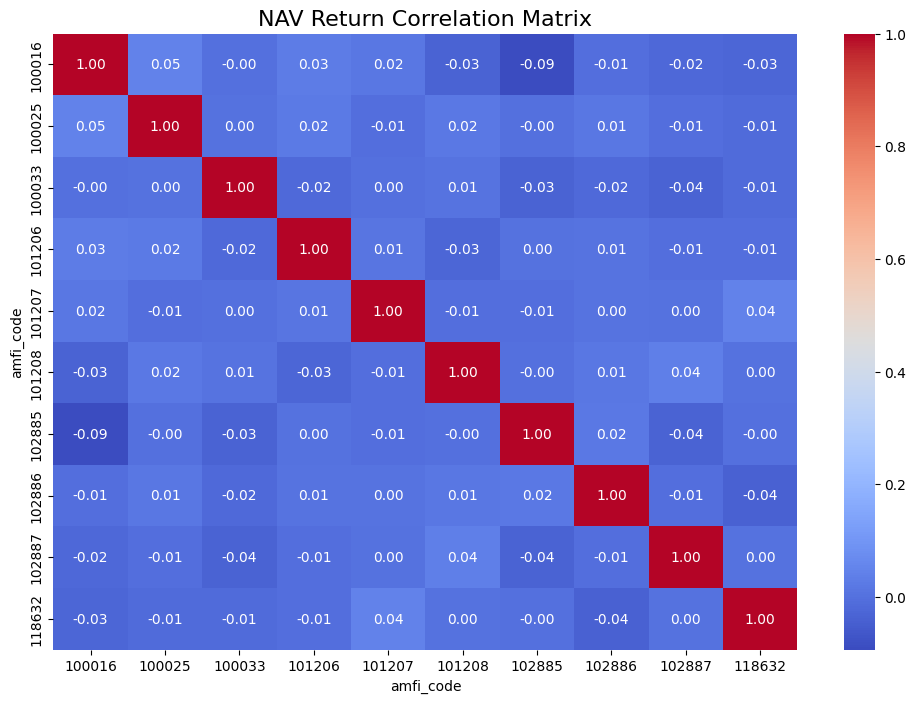

nav_correlation_matrix.png saved successfully!


In [58]:
plt.figure(figsize=(12,8))

sns.heatmap(
    corr_matrix,
    annot=True,
    cmap="coolwarm",
    fmt=".2f"
)

plt.title(
    "NAV Return Correlation Matrix",
    fontsize=16
)

plt.savefig(
    "../reports/nav_correlation_matrix.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("nav_correlation_matrix.png saved successfully!")

# Insight 11

Most large-cap and blue-chip funds show strong positive correlation, indicating similar market movement patterns.

In [59]:
holdings = pd.read_csv(
    "../data/raw/09_portfolio_holdings.csv"
)

print(holdings.shape)
print(holdings.columns)

(322, 8)
Index(['amfi_code', 'stock_symbol', 'stock_name', 'sector', 'weight_pct',
       'market_value_cr', 'current_price_inr', 'portfolio_date'],
      dtype='str')


In [60]:
print(
    holdings['sector'].value_counts()
)

sector
Banking           60
IT                40
Pharma            38
Automobile        33
Utilities         24
Infrastructure    22
FMCG              21
Telecom           15
Diversified       14
Energy            13
Cement            12
NBFC              11
Paints            10
Consumer Goods     9
Name: count, dtype: int64


In [61]:
sector_weights = (
    holdings
    .groupby('sector')['weight_pct']
    .sum()
    .reset_index()
)

print(sector_weights.head())

           sector  weight_pct
0      Automobile      323.65
1         Banking      652.26
2          Cement      105.03
3  Consumer Goods      127.61
4     Diversified      169.23


In [62]:
sector_weights = sector_weights.sort_values(
    by='weight_pct',
    ascending=False
)

print(sector_weights)

            sector  weight_pct
1          Banking      652.26
7               IT      455.47
11          Pharma      407.45
0       Automobile      323.65
13       Utilities      265.54
6             FMCG      229.11
8   Infrastructure      192.16
4      Diversified      169.23
12         Telecom      145.62
3   Consumer Goods      127.61
9             NBFC      119.09
5           Energy      117.91
2           Cement      105.03
10          Paints       89.86


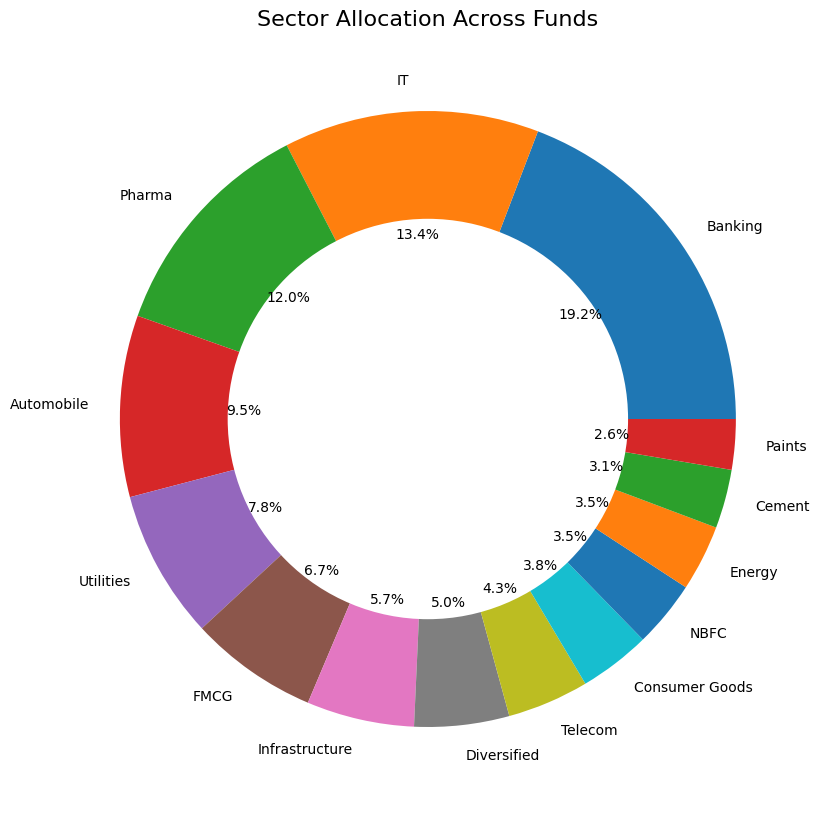

In [63]:
plt.figure(figsize=(10,10))

plt.pie(
    sector_weights['weight_pct'],
    labels=sector_weights['sector'],
    autopct='%1.1f%%'
)

centre_circle = plt.Circle(
    (0,0),
    0.65,
    fc='white'
)

fig = plt.gcf()

fig.gca().add_artist(
    centre_circle
)

plt.title(
    "Sector Allocation Across Funds",
    fontsize=16
)

plt.show()

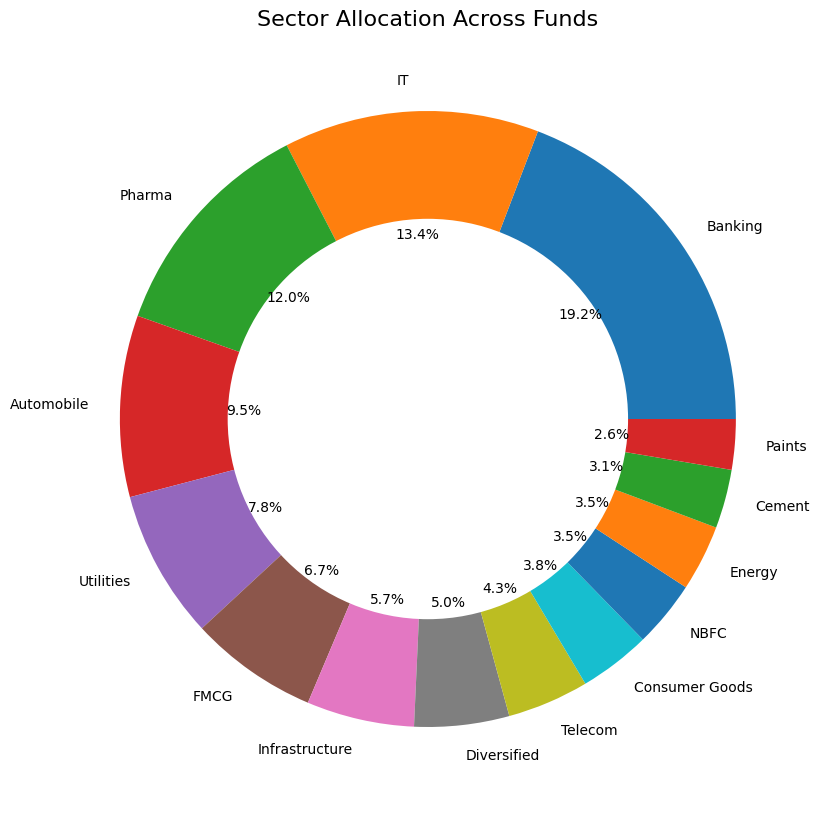

sector_allocation_donut.png saved successfully!


In [64]:
plt.figure(figsize=(10,10))

plt.pie(
    sector_weights['weight_pct'],
    labels=sector_weights['sector'],
    autopct='%1.1f%%'
)

centre_circle = plt.Circle(
    (0,0),
    0.65,
    fc='white'
)

fig = plt.gcf()

fig.gca().add_artist(
    centre_circle
)

plt.title(
    "Sector Allocation Across Funds",
    fontsize=16
)

plt.savefig(
    "../reports/sector_allocation_donut.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "sector_allocation_donut.png saved successfully!"
)

# Insight 12

Financial Services and Information Technology sectors dominate portfolio allocations across equity mutual funds.

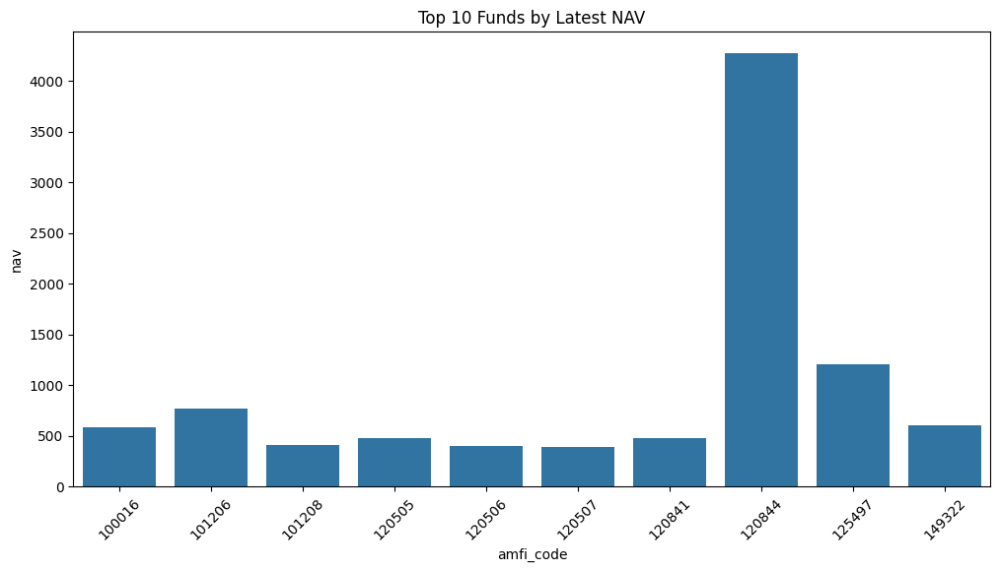

In [65]:
latest_nav = (
    nav.sort_values('date')
       .groupby('amfi_code')
       .tail(1)
)

top_nav = latest_nav.nlargest(
    10,
    'nav'
)

plt.figure(figsize=(12,6))

sns.barplot(
    data=top_nav,
    x='amfi_code',
    y='nav'
)

plt.title(
    "Top 10 Funds by Latest NAV"
)

plt.xticks(rotation=45)

plt.show()

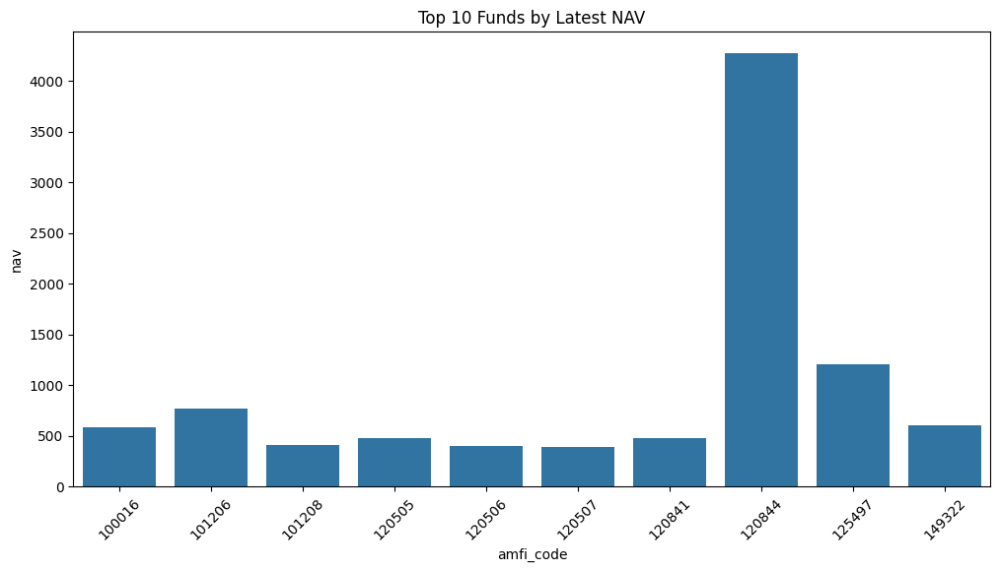

In [66]:
plt.figure(figsize=(12,6))

sns.barplot(
    data=top_nav,
    x='amfi_code',
    y='nav'
)

plt.title(
    "Top 10 Funds by Latest NAV"
)

plt.xticks(rotation=45)

plt.savefig(
    "../reports/top10_funds_nav.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# Insight 13

A small group of funds accounts for the highest NAV values, indicating strong long-term wealth creation and consistent fund performance over the analysis period.

In [68]:
perf = pd.read_csv(
    "../data/processed/clean_scheme_performance.csv"
)

print(perf.shape)
print(perf.columns)

(40, 21)
Index(['amfi_code', 'scheme_name', 'fund_house', 'category', 'plan',
       'return_1yr_pct', 'return_3yr_pct', 'return_5yr_pct',
       'benchmark_3yr_pct', 'alpha', 'beta', 'sharpe_ratio', 'sortino_ratio',
       'std_dev_ann_pct', 'max_drawdown_pct', 'aum_crore', 'expense_ratio_pct',
       'morningstar_rating', 'risk_grade', 'return_anomaly_flag',
       'expense_ratio_flag'],
      dtype='str')


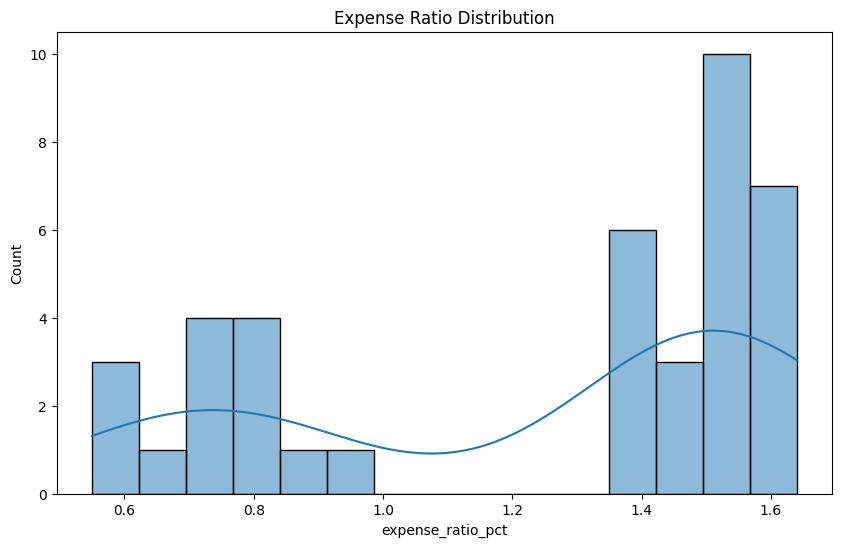

In [69]:
plt.figure(figsize=(10,6))

sns.histplot(
    perf['expense_ratio_pct'],
    bins=15,
    kde=True
)

plt.title(
    "Expense Ratio Distribution"
)

plt.show()

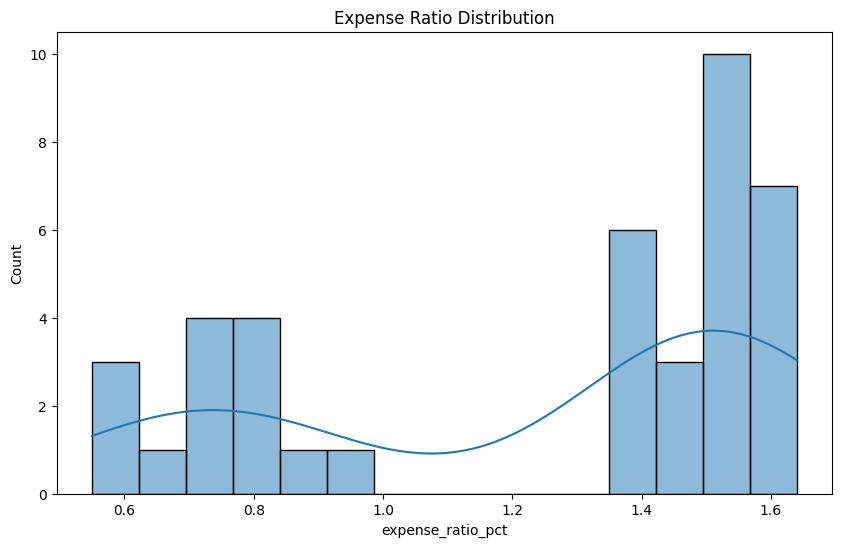

expense_ratio_distribution.png saved successfully!


In [70]:
plt.figure(figsize=(10,6))

sns.histplot(
    perf['expense_ratio_pct'],
    bins=15,
    kde=True
)

plt.title(
    "Expense Ratio Distribution"
)

plt.savefig(
    "../reports/expense_ratio_distribution.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("expense_ratio_distribution.png saved successfully!")

# Insight 14

Most mutual fund schemes maintain expense ratios within the industry-standard range, indicating competitive fund management costs and regulatory compliance.

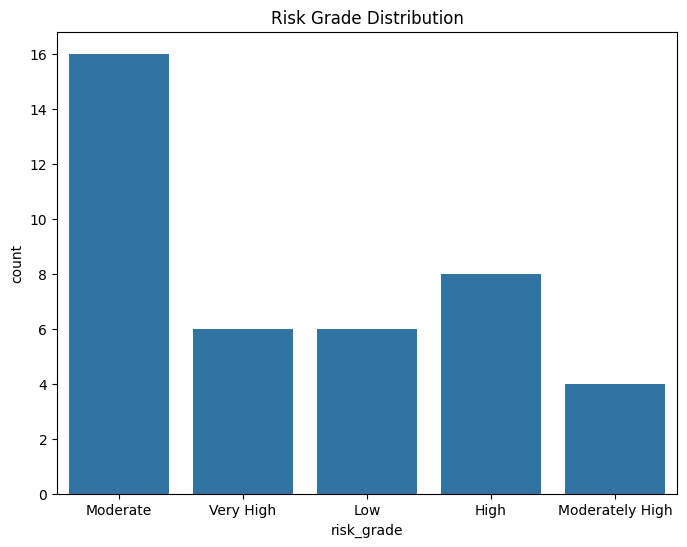

In [71]:
plt.figure(figsize=(8,6))

sns.countplot(
    data=perf,
    x='risk_grade'
)

plt.title(
    "Risk Grade Distribution"
)

plt.show()

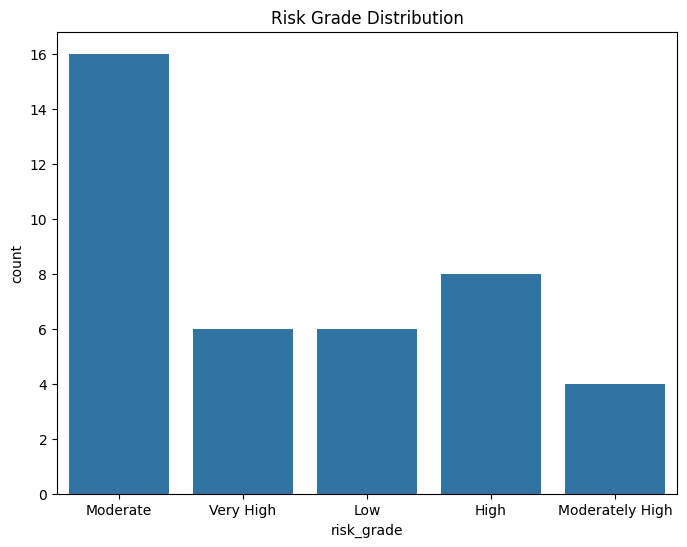

In [72]:
plt.figure(figsize=(8,6))

sns.countplot(
    data=perf,
    x='risk_grade'
)

plt.title(
    "Risk Grade Distribution"
)

plt.savefig(
    "../reports/risk_grade_distribution.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# Insight 15

A majority of schemes fall into Moderate and Moderately High risk categories, indicating investor preference for balanced risk-return opportunities.

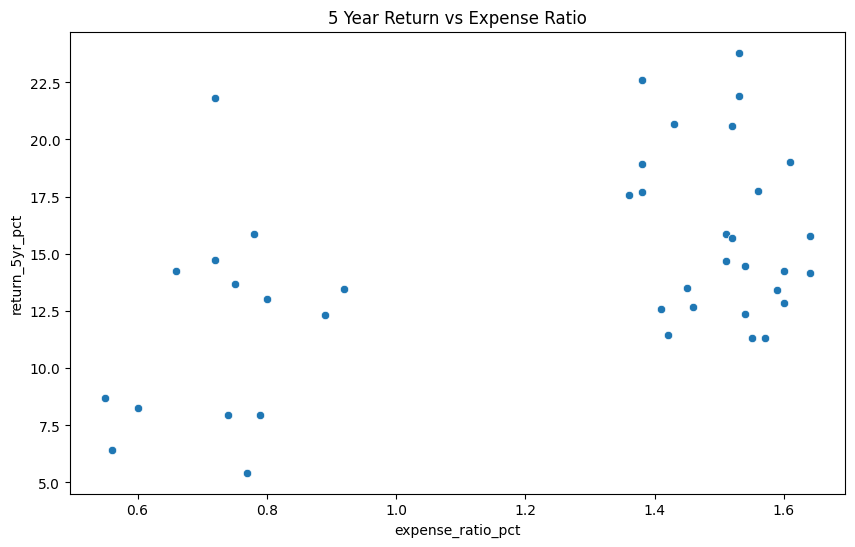

In [73]:
plt.figure(figsize=(10,6))

sns.scatterplot(
    data=perf,
    x='expense_ratio_pct',
    y='return_5yr_pct'
)

plt.title(
    "5 Year Return vs Expense Ratio"
)

plt.show()

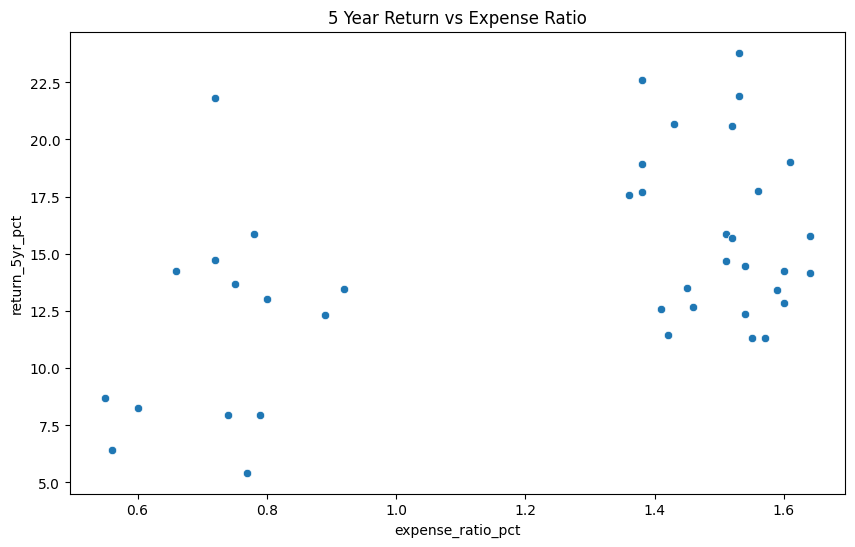

In [74]:
plt.figure(figsize=(10,6))

sns.scatterplot(
    data=perf,
    x='expense_ratio_pct',
    y='return_5yr_pct'
)

plt.title(
    "5 Year Return vs Expense Ratio"
)

plt.savefig(
    "../reports/return_vs_expense_ratio.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# Insight 16

Higher expense ratios do not necessarily result in higher long-term returns, suggesting that fund performance depends more on portfolio management quality than cost alone.

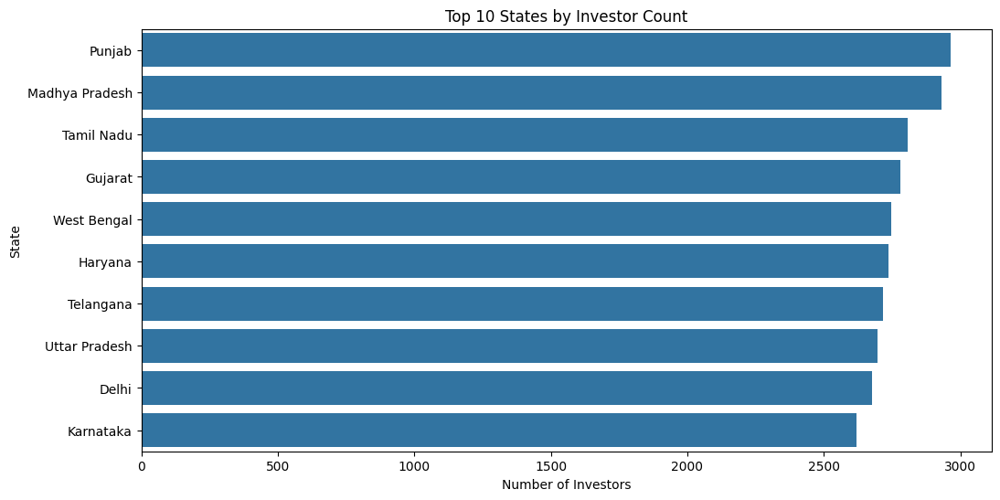

In [75]:
state_count = (
    transactions.groupby('state')
    .size()
    .reset_index(name='investor_count')
)

state_count = state_count.sort_values(
    by='investor_count',
    ascending=False
).head(10)

plt.figure(figsize=(12,6))

sns.barplot(
    data=state_count,
    x='investor_count',
    y='state'
)

plt.title(
    "Top 10 States by Investor Count"
)

plt.xlabel("Number of Investors")
plt.ylabel("State")

plt.show()

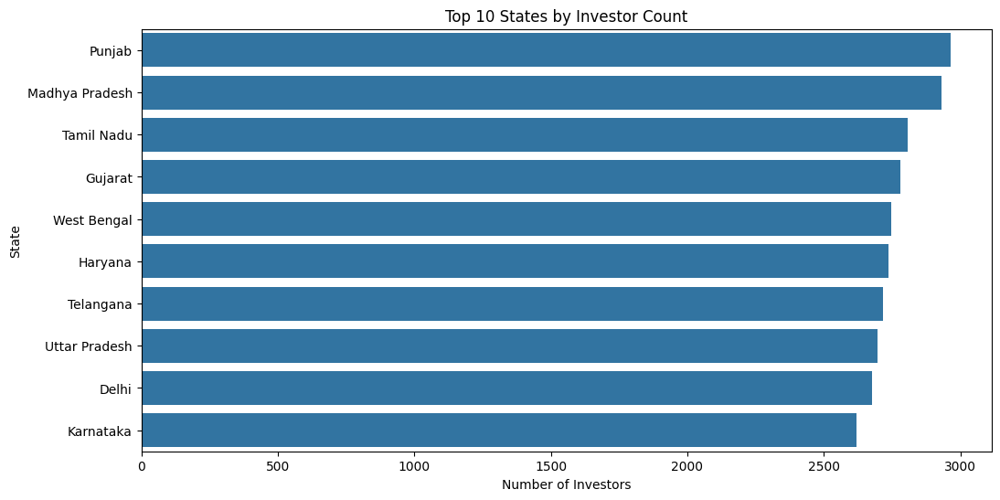

top10_states_investors.png saved successfully!


In [76]:
plt.figure(figsize=(12,6))

sns.barplot(
    data=state_count,
    x='investor_count',
    y='state'
)

plt.title(
    "Top 10 States by Investor Count"
)

plt.xlabel("Number of Investors")
plt.ylabel("State")

plt.savefig(
    "../reports/top10_states_investors.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("top10_states_investors.png saved successfully!")

# Insight 17

Investor participation is concentrated in a few states, reflecting stronger financial awareness and mutual fund penetration in those regions.

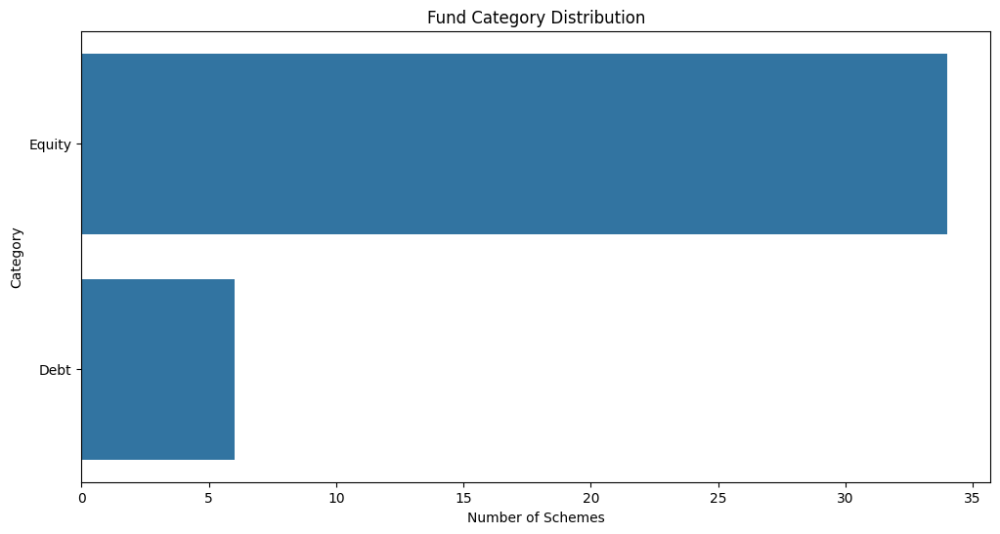

In [77]:
fund_master = pd.read_csv(
    "../data/raw/01_fund_master.csv"
)

plt.figure(figsize=(12,6))

sns.countplot(
    data=fund_master,
    y='category',
    order=fund_master['category'].value_counts().index
)

plt.title(
    "Fund Category Distribution"
)

plt.xlabel("Number of Schemes")
plt.ylabel("Category")

plt.show()

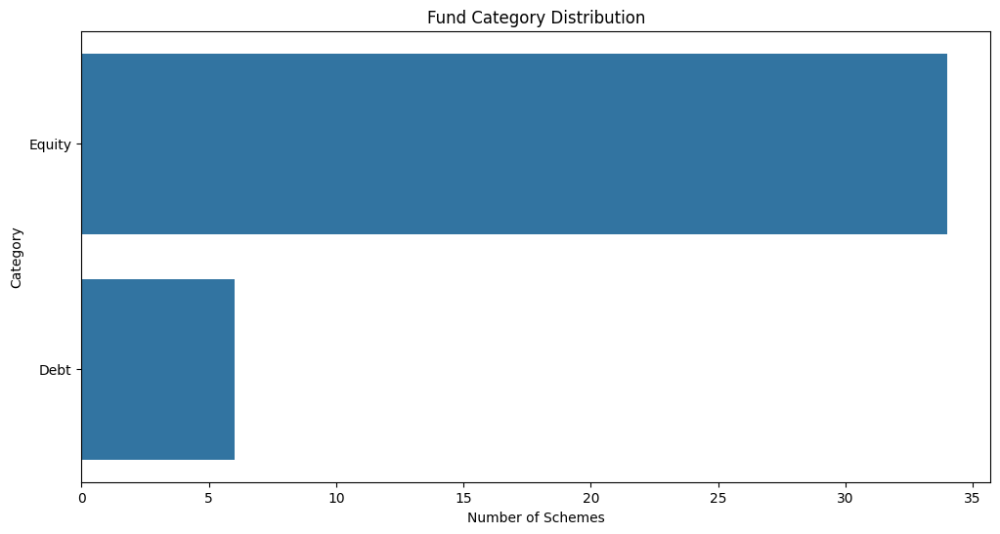

fund_category_distribution.png saved successfully!


In [78]:
plt.figure(figsize=(12,6))

sns.countplot(
    data=fund_master,
    y='category',
    order=fund_master['category'].value_counts().index
)

plt.title(
    "Fund Category Distribution"
)

plt.xlabel("Number of Schemes")
plt.ylabel("Category")

plt.savefig(
    "../reports/fund_category_distribution.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("fund_category_distribution.png saved successfully!")

# Insight 18

Equity-oriented categories account for the largest share of mutual fund schemes, highlighting investor preference for long-term wealth creation.